In [1]:
#import necessary packages
import os
import numpy as np
import cv2
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
%matplotlib inline

This image is: <class 'numpy.ndarray'> with dimensions: (540, 960, 3)


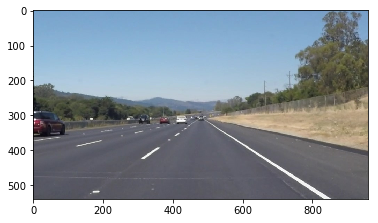

In [2]:
#reading in an image
image = mpimg.imread('test_images/solidWhiteRight.jpg')

#printing out some stats and plotting
print('This image is:', type(image), 'with dimensions:', image.shape)
plt.imshow(image)

In [3]:
def grayscale(img):
    """Applies the Grayscale transform"""
    return cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    # Or use BGR2GRAY if you read an image with cv2.imread()
    # return cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    
def canny(img, low_threshold, high_threshold):
    """Applies the Canny transform"""
    return cv2.Canny(img, low_threshold, high_threshold)

def gaussian_blur(img, kernel_size):
    """Applies a Gaussian Noise kernel"""
    return cv2.GaussianBlur(img, (kernel_size, kernel_size), 0)

def region_of_interest(img, vertices):
    """
    Applies an image mask.
    
    Only keeps the region of the image defined by the polygon
    formed from `vertices`. The rest of the image is set to black.
    """
    #defining a blank mask to start with
    mask = np.zeros_like(img)   
    
    #defining a 3 channel or 1 channel color to fill the mask with depending on the input image
    if len(img.shape) > 2:
        channel_count = img.shape[2]  # i.e. 3 or 4 depending on your image
        ignore_mask_color = (255,) * channel_count
    else:
        ignore_mask_color = 255
        
    #filling pixels inside the polygon defined by "vertices" with the fill color    
    cv2.fillPoly(mask, vertices, ignore_mask_color)
    
    #returning the image only where mask pixels are nonzero
    masked_image = cv2.bitwise_and(img, mask)
    return masked_image


def get_slopes_n_biases(lines):
    """
    Calculates slopes and biases of lines, distinguishing between
    left and right based on whether the slope is positive or negative.
    """
    slopes_right, biases_right, slopes_left, biases_left = [], [], [], []
    lines_r = []
    lines_l = []

    for line in lines:
        for x1,y1,x2,y2 in line:
        # Because pixel (0,0) is in top left corner of image, change y to -y to calculate slope
            y1 = -y1
            y2 = -y2
            if (y2-y1)/(x2-x1) < 0:
                m_right = (y2-y1)/(x2-x1)
                b_right = y2 - m_right*x2
                slopes_right.append(m_right)
                biases_right.append(b_right)
                lines_r.append([x1,y1,x2,y2])
            if (y2-y1)/(x2-x1) > 0:
                m_left = (y2-y1)/(x2-x1)
                b_left = y2 - m_left*x2
                slopes_left.append(m_left)
                biases_left.append(b_left)
                lines_l.append([x1,y1,x2,y2])
    return slopes_right, biases_right, slopes_left, biases_left

def get_x(y, m, b):
    """Given y, slope, and bias of line, calculates x """
    out = y - b
    return out / m

def draw_lines(lines, line_img, color=[255, 0, 0], thickness=15):
    """
    Finds average left and right Hough lines, drawing one segment for each 
    from the bottom of the frame, y=-540, to about halfway up, y=-333.
    'line_img' is blank (all black) frame
    default 'color' is red
    """
    slopes_right, biases_right, slopes_left, biases_left = get_slopes_n_biases(lines)
    m_left = np.nanmean(slopes_left)
    b_left = np.nanmean(biases_left)
    m_right = np.nanmean(slopes_right)
    b_right = np.nanmean(biases_right)
    y1_l = -540
    x1_l = int(get_x(y1_l, m_left, b_left))
    y2_l = -333
    x2_l = int(get_x(y2_l, m_left, b_left))
    y1_r = -540
    x1_r = int(get_x(y1_r, m_right, b_right))
    y2_r = -333
    x2_r = int(get_x(y2_r, m_right, b_right))
    #Be sure to change -y back to y after calculating x
    cv2.line(line_img, (x1_l, -y1_l), (x2_l, -y2_l), color, thickness)
    cv2.line(line_img, (x1_r, -y1_r), (x2_r, -y2_r), color, thickness)

def hough_lines(img, rho, theta, threshold, min_line_len, max_line_gap):
    """
    `img` should be the output of a Canny transform.   
    Returns an image with hough lines drawn.
    """
    lines = cv2.HoughLinesP(img, rho, theta, threshold, np.array([]), 
                            minLineLength=min_line_len, maxLineGap=max_line_gap)
    line_img = np.zeros((img.shape[0], img.shape[1], 3), dtype=np.uint8)
    draw_lines(lines, line_img)
    return line_img, lines


def weighted_img(img, initial_img, α=0.8, β=1., λ=0.):
    """
    `img` should be a blank image with lines drawn on it.
    `initial_img` should be the image before processing.
    
    The result is computed as follows:
    initial_img * α + img * β + λ
    """
    return cv2.addWeighted(initial_img, α, img, β, λ)

In [4]:
#Make pipeline function
def add_lines(img):
    gray = grayscale(img)
    blurred = gaussian_blur(gray, 5)
    edges = canny(blurred, 50, 150)
    #'vertices' is an array of tuples, marking the edges of polygonal mask. 
    # These will change depending on shape of image and where the camera is mounted on the car.
    vertices = np.array([[(100, edges.shape[0]), (470 , 300), (505, 300), (940 , edges.shape[0])]])
    masked_image = region_of_interest(edges, vertices)
    rho = 1
    theta = np.pi/180
    threshold = 50
    min_line_len = 100
    max_line_gap = 50
    line_img, _ = hough_lines(masked_image, rho, theta, threshold, min_line_len, max_line_gap)
    out = weighted_img(line_img, img, α=0.8, β=1., λ=0.)
    return out

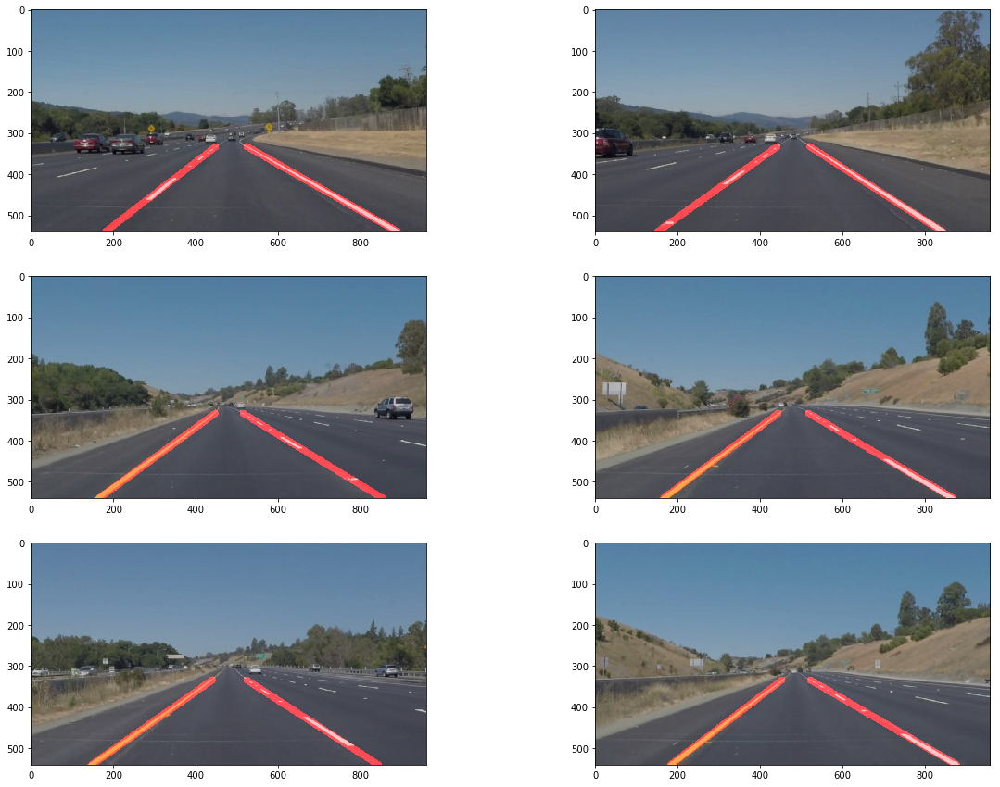

In [5]:
#Test pipeline on images in the test_directory. Plot and save them to test_images_output directior
!mkdir test_images_output

plt.figure(figsize=(20,15))
for i in range(len(os.listdir("test_images/"))):
    plt.subplot(3,2,(i+1))
    out = add_lines(mpimg.imread("test_images/"+os.listdir("test_images/")[i]))
    mpimg.imsave('test_images_output/'+os.listdir("test_images/")[i], out)
    plt.imshow(out)

### So far so good, now for videos...

I started with the easiest video, the one with the solid white line on the right.

**NOTE: I got following error the first time around when I tried opening the videos in the notebook:**
```
IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.
```
**From [here](https://github.com/jupyter/notebook/issues/2287) I learned that restarting jupyter like this did the trick:**

`> jupyter notebook --NotebookApp.iopub_data_rate_limit=10000000000`

In [6]:
from moviepy.editor import VideoFileClip
from IPython.display import HTML
import io
import base64

In [7]:
!mkdir test_videos_output
white_output = 'test_videos_output/solidWhiteRight.mp4'
clip1 = VideoFileClip("test_videos/solidWhiteRight.mp4")
white_clip = clip1.fl_image(add_lines) #NOTE: this function expects color images!!
%time white_clip.write_videofile(white_output, audio=False)

[MoviePy] >>>> Building video test_videos_output/solidWhiteRight.mp4
[MoviePy] Writing video test_videos_output/solidWhiteRight.mp4


100%|█████████▉| 221/222 [00:05<00:00, 42.06it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: test_videos_output/solidWhiteRight.mp4 

CPU times: user 2.78 s, sys: 871 ms, total: 3.65 s
Wall time: 5.98 s


In [8]:
video = io.open(white_output, 'r+b').read()
encoded = base64.b64encode(video)
HTML(data='''<video alt="test" controls>
                <source src="data:video/mp4;base64,{0}" type="video/mp4" />
             </video>'''.format(encoded.decode('ascii')))

### Cool. Now the video with the solid yellow line on the left...

In [9]:
yellow_output = 'test_videos_output/solidYellowLeft.mp4'
clip2 = VideoFileClip('test_videos/solidYellowLeft.mp4')
yellow_clip = clip2.fl_image(add_lines)
%time yellow_clip.write_videofile(yellow_output, audio=False)

[MoviePy] >>>> Building video test_videos_output/solidYellowLeft.mp4
[MoviePy] Writing video test_videos_output/solidYellowLeft.mp4


100%|█████████▉| 681/682 [00:17<00:00, 39.24it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: test_videos_output/solidYellowLeft.mp4 

CPU times: user 8.84 s, sys: 2.67 s, total: 11.5 s
Wall time: 18.1 s


In [10]:
video = io.open(yellow_output, 'r+b').read()
encoded = base64.b64encode(video)
HTML(data='''<video alt="test" controls>
                <source src="data:video/mp4;base64,{0}" type="video/mp4" />
             </video>'''.format(encoded.decode('ascii')))

### Not bad...

There are one or two single frame mess-ups, as above, that don't veer off the road or into the wrong lane but could slow the car's progress, but they instantly fix themselves. Overall, it works pretty well, so I tested it on the challenge video. However, the current pipeline has several issues:

1) Challenge video has a different image shape, so needed a new image mask and new y-values for the endpoints in the draw_lines function.

2) The white dotted lines on the right often have large spaces, making it difficult for the hough_lines function to detect the lines.

3) The white dotted lines sometimes blend into the road, also making it hard for edge detection.

4) The solid yellow line on the left also sometimes blends in due to brightness and changing road color.

5) The solid yellow line is always long, but if the min_line_len is too short, Hough lines function will detect irrelevant lines, which can be caused by factors like tree shadows.

<figure>
 <img src="examples/lines_frame_98" width="380" alt="Combined Image" />
  <img src="examples/lines_frame_139" width="380" alt="Combined Image" />
 <img src="examples/lines_frame_159" width="380" alt="Combined Image" />
 <figcaption>
 <p></p> 
 <p style="text-align: center;">**Long spaces between dotted lines, different road colors, and shadows can be problematic for edge and line detection.**</p> 
 </figcaption>
</figure>
 <p></p> 

To fix everything I created two image masks, one to highlight the left lane and the other the right. I did this to control the threshold, min_line_len, and max_gap_len in the hough_lines function, allowing me to fine-tune the hyperparameters separately.

This helped, but there were still problems with poor contrast due to a change in road color or long spaces between the white dotted lines. For the most part, neither issue lasted for many frames, so I calculated the endpoints of the line segments with a moving average of the average slopes and biases over the previous five frames. This also helped to avoid the occasional frame when light conditions made useful Hough line detection with our current set-up impossible. Without something like a moving average, if no right line is detected, then there is no way to caculate x and y values for the right lane's endpoints, causing the pipeline to break.

Even the moving average can't help when light road color causes poor contrast for several frames, yet the hough_lines function detects at least one line per side. I did a test run with the current pipeline. Afterwards, uisng np.percentile, I calculated the 15th and 85th percentile of average slopes for the right and left lines. I changed the get_slopes_n_biases function so only those lines detected by the hough_lines function that had slopes within around the 15th and 85th percentile range were used. 

In [11]:
# updatd the following helper functions to reflect the changes above
def get_slopes_n_biases(lines, side):
    slopes, biases = [], []
    if type(lines) == np.ndarray:
        for line in lines:
            for x1,y1,x2,y2 in line:
                y1 = -y1
                y2 = -y2
                if x1 != x2:
                    if side == 'right':
                        if (y2-y1)/(x2-x1) < 0:
                            m = (y2-y1)/(x2-x1)
                            if -0.65 < m < -0.50:
                                b = y2 - m*x2
                                slopes.append(m)
                                biases.append(b)
                    if side == 'left':
                        if (y2-y1)/(x2-x1) > 0:
                            m = (y2-y1)/(x2-x1)
                            if 0.60 < m <  0.75:
                                b = y2 - m*x2
                                slopes.append(m)
                                biases.append(b)
    return slopes, biases

def get_x(y, m, b):
    out = y - b
    return out / m

def draw_lines(lines, line_img, side, ms, bs, color=[255, 0, 0], thickness=15):
    slopes, biases = get_slopes_n_biases(lines, side)
    if slopes != []:
        ms.append(np.nanmean(slopes))
        bs.append(np.nanmean(biases))
    m = np.nanmean(ms[-5:])
    b = np.nanmean(bs[-5:])
    y1 = -685
    x1 = int(get_x(y1, m, b))
    y2 = -475
    x2 = int(get_x(y2, m, b))
    cv2.line(line_img, (x1, -y1), (x2, -y2), color, thickness)

def hough_lines(masked_image_L, masked_image_R, ms_L, bs_L, ms_R, bs_R, rho, theta, 
                threshold_L, threshold_R, min_line_len_L, min_line_len_R, 
                max_line_gap_L, max_line_gap_R):
    lines_L = cv2.HoughLinesP(masked_image_L, rho, theta, threshold_L, np.array([]), 
                              minLineLength=min_line_len_L, maxLineGap=max_line_gap_L)
    
    lines_R = cv2.HoughLinesP(masked_image_R, rho, theta, threshold_R, np.array([]), 
                              minLineLength=min_line_len_R, maxLineGap=max_line_gap_R)
    
    line_img = np.zeros((masked_image_L.shape[0], masked_image_L.shape[1], 3), dtype=np.uint8)
    draw_lines(lines_L, line_img, 'left', ms_L, bs_L)
    draw_lines(lines_R, line_img, 'right', ms_R, bs_R)
    return line_img, lines_L, lines_R

In [12]:
#updated the add_lines function to reflect the changes above.
lines = []
ms_L, bs_L, ms_R, bs_R = [], [], [], []
def add_lines(img):
    gray = grayscale(img)
    blurred = gaussian_blur(gray, 9)
    blurred_cpy = np.copy(blurred)
    edges_L = canny(blurred, 10, 100)
    edges_R = canny(blurred_cpy, 50, 150)
    vertices_L = np.array([[(150, 650), (550 , 500), (675, 500), (575 , 650)]])
    vertices_R = np.array([[(800, 650), (700 , 500), (775, 500), (1150 , 650)]])
    masked_image_L = region_of_interest(edges_L, vertices_L)
    masked_image_R = region_of_interest(edges_R, vertices_R)
    threshold_L = 1
    min_line_len_L = 80
    max_line_gap_L = 40
    
    threshold_R = 1
    min_line_len_R = 50
    max_line_gap_R = 30
    line_img, lines_L, lines_R = hough_lines(masked_image_L, masked_image_R, ms_L, bs_L, ms_R, bs_R,
                                             1, np.pi/180, threshold_L, threshold_R, 
                                             min_line_len_L, min_line_len_R, 
                                             max_line_gap_L, max_line_gap_R)
    
    lines.append(lines_L)
    lines.append(lines_R)
    out = weighted_img(line_img, img, α=0.8, β=1., λ=0.)
    return out

In [13]:
challenge_output = 'test_videos_output/challenge.mp4'
clip3 = VideoFileClip('test_videos/challenge.mp4')
challenge_clip = clip3.fl_image(add_lines)
%time challenge_clip.write_videofile(challenge_output, audio=False)

[MoviePy] >>>> Building video test_videos_output/challenge.mp4
[MoviePy] Writing video test_videos_output/challenge.mp4


100%|██████████| 251/251 [00:13<00:00, 19.18it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: test_videos_output/challenge.mp4 

CPU times: user 6.64 s, sys: 2.4 s, total: 9.04 s
Wall time: 14.5 s


In [14]:
video = io.open(challenge_output, 'r+b').read()
encoded = base64.b64encode(video)
HTML(data='''<video alt="test" controls>
                <source src="data:video/mp4;base64,{0}" type="video/mp4" />
             </video>'''.format(encoded.decode('ascii')))

### I think our car has pretty safe lane lines :)